In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
from chart_studio import plotly as py
from chart_studio.plotly import iplot
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import datetime, pytz

In [2]:
data = pd.read_csv('btcusd_1-min_data.csv')

# Data can be doanloaded at https://www.kaggle.com/datasets/mczielinski/bitcoin-historical-data

## fix data set for missing values and fill the na's with zeros
data.dropna(inplace = True)
data['Mean_Price'] = (data['Open'] + data['Close']) / 2

data['Timestamp'] = pd.to_datetime(data['Timestamp'], unit = 's').dt.tz_localize('UTC')

cutoff_date = '2024-08-31' # we stop at this time because there is a sudden surge of BTC price around Dec

data = data[data['Timestamp'] < cutoff_date]
# data.info()
# print(data.head())
# print(len(data))

In [3]:
start = datetime.datetime(2018, 1, 1, 0, 0, 0, 0, pytz.UTC)
end = datetime.datetime(2024, 8, 31, 0, 0, 0, 0, pytz.UTC)
# Year, Month, Day, Hour, Minute, Second, Micorsecond


In [4]:
weekly_rows = data[(data['Timestamp'] >= start) & (data['Timestamp'] <= end)].groupby([pd.Grouper(key = 'Timestamp', freq = 'W-MON')]).first().reset_index()
# weekly_rows.head()

In [5]:
trace1 = go.Scatter(
    x = weekly_rows['Timestamp'],
    y = weekly_rows['Open'].astype(float),
    mode = 'lines',
    name = 'Open')

trace2 = go.Scatter(
    x = weekly_rows['Timestamp'],
    y = weekly_rows['Close'].astype(float),
    mode = 'lines',
    name = 'Close')

trace3 = go.Scatter(
    x = weekly_rows['Timestamp'],
    y = weekly_rows['Mean_Price'].astype(float),
    mode = 'lines',
    name = 'Average')


layout = dict(
    title = f"Historical Price Bitcoin from {start.strftime('%Y-%m-%d')} to {end.strftime('%Y-%m-%d')} with slider",
    xaxis = dict(
        rangeselector = dict(
            buttons = list([
                dict(count = 1,
                     label = '1m',
                     step = 'month',
                     stepmode = 'backward'),
                dict(count = 6,
                    label = '6m',
                    step = 'month',
                    stepmode = 'backward'),
                dict(count = 12,
                    label = '12m',
                    step = 'month',
                    stepmode = 'backward'),
                dict(count = 36,
                    label = '36m',
                    step = 'month',
                    stepmode = 'backward'),
                dict(step = 'all')
            ])
        
        ),
        rangeslider = dict(visible = True), type = 'date'
    
    )
)

data = [trace1, trace2, trace3]
fig = dict(data = data, layout = layout)
iplot(fig, filename = "Time Series with Range Slider")

In [6]:
## LSTM Model for prediction ###
data = pd.read_csv('btcusd_1-min_data.csv')
data['Timestamp'] = pd.to_datetime(data['Timestamp'], unit = 's')

cutoff_date = '2024-08-31'

data = data[data['Timestamp'] < cutoff_date]
# print(data['Timestamp'])
# data['Timestamp'] = data['Timestamp'].dt.tz_localize(None)
data = data.groupby([pd.Grouper(key = 'Timestamp', freq = 'H')]).first().reset_index()
data = data.set_index('Timestamp')
## fix data set for missing values and fill the na's with zeros
data.dropna(inplace = True)
data['Mean_Price'] = (data['Open'] + data['Close']) / 2
data = data[['Mean_Price']]

split_date = '1-6-2024'
# Day, Month, Year

data_train = data.loc[data.index <= split_date].copy() 
data_test = data.loc[data.index > split_date].copy()

print('Training data shape:', data_train.shape)
print('Test data shape:', data_test.shape)


training_set = data_train.values
# print(data_test)


Training data shape: (105291, 1)
Test data shape: (5704, 1)


In [7]:
# Preprocessing and Scaling
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()

training_set = sc.fit_transform(training_set)

X_train = training_set[0:len(training_set) - 1]
y_train = training_set[1:len(training_set)]

#Need to make X_train a 3D array for LSTM input

X_train = np.reshape(X_train, (len(X_train), 1, 1))



In [8]:
# color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
# _ = data.plot(style='', figsize=(15,5), color=color_pal[2], title='BTC Weighted_Price Price (USD) by Hours')

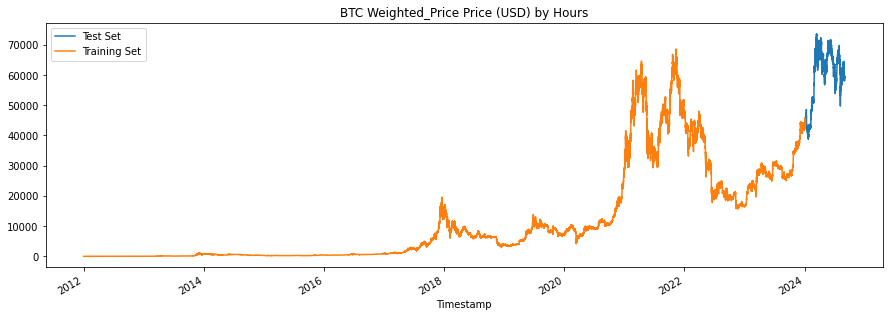

In [9]:
_ = data_test \
    .rename(columns={'Mean_Price': 'Test Set'}) \
    .join(data_train.rename(columns={'Mean_Price': 'Training Set'}), how = 'outer')\
    .plot(figsize=(15,5), title='BTC Weighted_Price Price (USD) by Hours', style='')

In [10]:
# Import Keras Libraries 

from keras import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping

model = Sequential()
model.add(LSTM(units = 128, activation = 'sigmoid', return_sequences = True, input_shape = (1,1)))
model.add(Dropout(0.3))
model.add(Dense(1))
model.compile(loss = "mse", optimizer = 'Adam')
early_stopping = EarlyStopping(monitor = 'val_loss', patience = 20, restore_best_weights = True)

print(X_train.shape)
print(y_train.shape)

history = model.fit(
    X_train, y_train, 
    validation_split = 0.2, 
    epochs=50, 
    batch_size= 50,
    callbacks = [early_stopping]
    
)

(105290, 1, 1)
(105290, 1)
Epoch 1/50
1685/1685 [==============================] - 5s 3ms/step - loss: 0.0224 - val_loss: 0.0161
Epoch 2/50
1685/1685 [==============================] - 4s 2ms/step - loss: 0.0049 - val_loss: 0.0028
Epoch 3/50
1685/1685 [==============================] - 4s 2ms/step - loss: 0.0025 - val_loss: 5.0657e-04
Epoch 4/50
1685/1685 [==============================] - 4s 2ms/step - loss: 0.0016 - val_loss: 7.2725e-04
Epoch 5/50
1685/1685 [==============================] - 4s 3ms/step - loss: 0.0012 - val_loss: 2.8269e-04
Epoch 6/50
1685/1685 [==============================] - 5s 3ms/step - loss: 9.5285e-04 - val_loss: 9.1389e-05
Epoch 7/50
1685/1685 [==============================] - 5s 3ms/step - loss: 7.7300e-04 - val_loss: 2.4135e-04
Epoch 8/50
1685/1685 [==============================] - 4s 3ms/step - loss: 6.2999e-04 - val_loss: 1.5131e-04
Epoch 9/50
1685/1685 [==============================] - 4s 3ms/step - loss: 5.4300e-04 - val_loss: 1.3366e-04
Epoch 10/50

In [11]:
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 128)            66560     
                                                                 
 dropout (Dropout)           (None, 1, 128)            0         
                                                                 
 dense (Dense)               (None, 1, 1)              129       
                                                                 
Total params: 66,689
Trainable params: 66,689
Non-trainable params: 0
_________________________________________________________________


In [12]:
if 'Price_Prediction' in data_test.columns:
    data_test = data_test.drop(columns=['Price_Prediction'])
test_set = data_test.values

print(test_set.shape)

inputs = np.reshape(test_set, (len(test_set), 1))

inputs = sc.transform(inputs)
inputs = np.reshape(inputs, (len(inputs), 1, 1))
predicted_BTC_Price = model.predict(inputs)

predicted_BTC_Price = np.reshape(predicted_BTC_Price, (-1, 1))
predicted_BTC_Price = sc.inverse_transform(predicted_BTC_Price)

data_test['Price_Prediction'] = predicted_BTC_Price
data_all = pd.concat([data_test, data_train], sort = False)


fig = go.Figure()

fig.add_trace(go.Scatter(
    x = data_train.index,
    y = data_train['Mean_Price'],
    mode = 'lines',
    name = 'Training Mean Price',
    line = dict(color = 'blue', width = 2),
    opacity = 0.6
))

fig.add_trace(go.Scatter(
    x = data_test.index,
    y = data_test['Mean_Price'],
    mode = 'lines',
    name = 'Price Prediction',
    line = dict(color = 'blue', width = 2, dash = 'dot'),
    opacity = 0.6,
))

fig.add_trace(go.Scatter(
    x = data_test.index,
    y = data_test['Price_Prediction'],
    mode = 'lines',
    name = 'Price Prediction',
    line = dict(color = 'red', width = 2, dash = 'dot'),
    opacity = 1.0,
))


# Update layout
fig.update_layout(
    title='Mean Price vs. Price Prediction',
    xaxis_title='Timestamp',
    yaxis_title='Price',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    template='plotly_white',
    width=1000,
    height=500
)

# Show the figure
fig.show()
# _ = data_all[['Mean_Price','Price_Prediction']].plot(figsize=(15, 5))


(5704, 1)
179/179 [==============================] - 0s 1ms/step


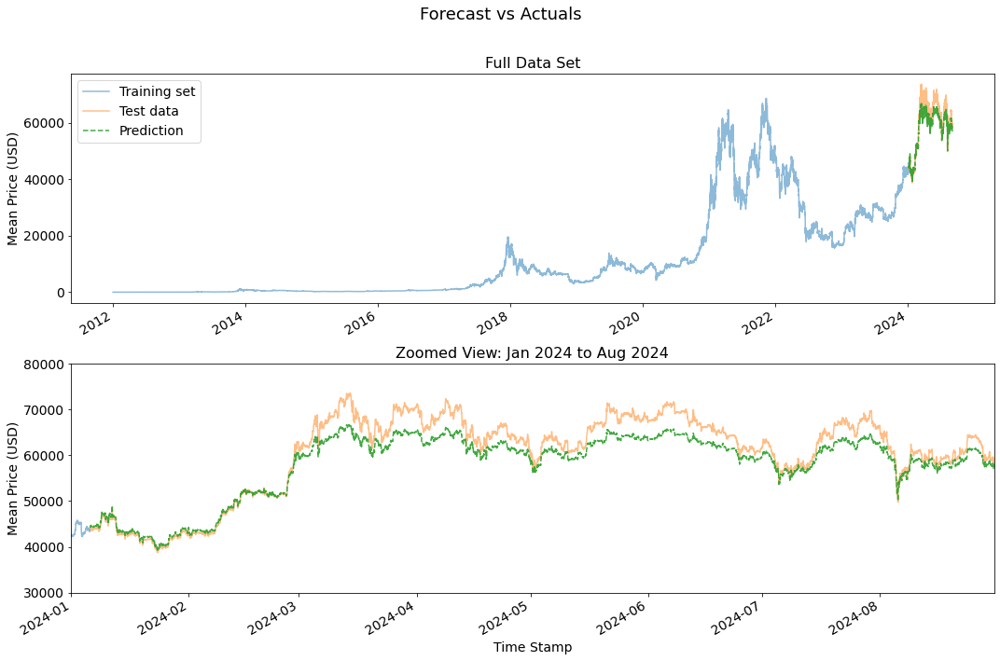

In [13]:
# Plot the prediction vs data
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=False)

# Entire dataset in the first subplot
# data_all[['Price_Prediction', 'Mean_Price']].plot(ax=ax1, style=['-', '.'])
data_train['Mean_Price'].plot(ax = ax1, style = '-', alpha = 0.5, label = 'Training set')
data_test['Mean_Price'].plot(ax = ax1, style = '-', alpha = 0.5, label = 'Test data')
data_test['Price_Prediction'].plot(ax = ax1, style = '--', alpha = 0.9, label = 'Prediction')

# ax1.set_xbound(lower='01-01-2013', upper='08-31-2024')
ax1.set_ylabel('Mean Price (USD)', fontsize=14)
ax1.set_title('Full Data Set', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.set_xlabel('')
ax1.legend(fontsize = 14)

# Plot the subset in the second subplot
data_train['Mean_Price'].plot(ax = ax2, style = '-', alpha = 0.5, label = 'Training set')
data_test['Mean_Price'].plot(ax = ax2, style = '-', alpha = 0.5, label = 'Test data')
data_test['Price_Prediction'].plot(ax = ax2, style = '--', alpha = 0.9, label = 'Prediction')
ax2.set_xbound(lower='01-01-2024', upper='08-31-2024')
ax2.set_ylim(30000, 80000)
ax2.set_ylabel('Mean Price (USD)', fontsize=14)
ax2.set_xlabel('Time Stamp', fontsize=14)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_title('Zoomed View: Jan 2024 to Aug 2024', fontsize=16)

f.suptitle('Forecast vs Actuals', fontsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()


In [14]:
#calculate MSE and MAE
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse = mean_squared_error(y_true=data_test['Mean_Price'],
                   y_pred=data_test['Price_Prediction'])

mae = mean_absolute_error(y_true=data_test['Mean_Price'],
                   y_pred=data_test['Price_Prediction'])

print(mse)
print(mae)

9086683.36876058
2499.116663607775


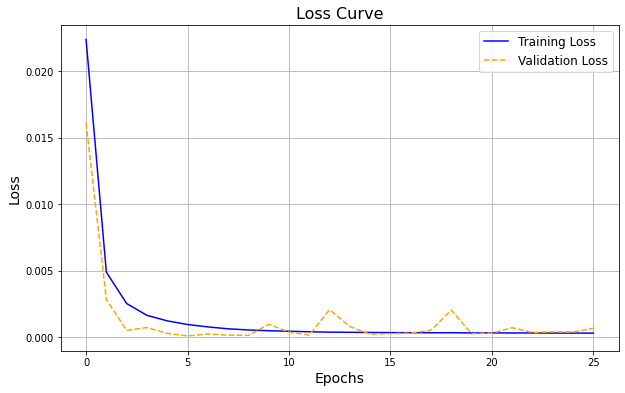

In [15]:
# Plot the loss curves
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', linestyle='--', color='orange')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Loss Curve', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()